**Note**: This Supplementary notebook computes FC matrices from different datasets, then compares them. The older 2-photon microscopy dataset is hosted on a local server (`Valeria`). Similarly, our downloaded version of the lightsheet dataset from *Chen et al. (2018) Neuron* is hosted on the same server, but is made publicly available by the authors and can be downloaded using a link provided below in the notebook. Some notebook cells that directly access this data are left here for proofreading purposes, but will not work in other circumstances. To circumvent this, we profide the FC matrices from both datasets in our public repository.

In [2]:
from main import *
import mat73
from scipy.io import loadmat
from scipy.stats import pearsonr
import seaborn as sns

plt.rcParams['font.size'] = 6
%matplotlib inline

# Setting paths

In [3]:
top_directory = '/media/anleg84/KINGSTON/Datasets/Networks2024/'
atlas_path = '/home/anleg84/Documents/Atlas/MapzebrainOld/'

excluded = np.load('Results/excluded_regions.npy')

atlas = MapzebrainAtlas(atlas_path)
acronyms = list(np.delete(atlas.acronyms, excluded))

FC = np.load('Results/FC_matrix.npy')

# Computing networks (2022 experiments)

Requires access to the private `Valeria` bucket. Loads data and computes FC matrices from 42 older experiments with homogeneous imaging parameters.

In [6]:
folders = identify_folders('/home/anleg84/Documents/Valeria/Data/', keywords=['2022'])
folders

['/home/anleg84/Documents/Valeria/Data/2022-01-18-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-02-01-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-02-02-Wholebrain-7dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-02-22-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-02-23-Wholebrain-7dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-02-24-Wholebrain-8dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-04-12-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-04-13-Wholebrain-7dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-07-26-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-07-27-Wholebrain-7dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-09-20-Wholebrain-6dpf/',
 '/home/anleg84/Documents/Valeria/Data/2022-09-21-Wholebrain-7dpf/']

In [7]:
def filter_timeseries(timeseries, sigma):
    filtered = np.copy(timeseries)
    for i in range(filtered.shape[0]):
        filtered[i] = gaussian_filter1d(filtered[i], sigma)
    return filtered

In [ ]:
sigma = 2

region_series = []
for f in tqdm(folders, file=sys.stdout):
    data_folders = get_datasets(f)

In [43]:
def get_data_folders(path):
    folders = identify_folders(path)
    data_folders = []
    for f in folders:
        files = identify_files(f, ['data', '.hdf5'])
        if any(files):
            data_folders.append(f)
    return data_folders

In [45]:
sigma = 2

region_series = []
for f in tqdm(folders, file=sys.stdout):
    data_folders = get_data_folders(f)
    for df in data_folders:
        metadata = load_metadata(df)
        if 'dark' not in metadata['stimulus']:
            region_series.append(np.load(df + 'region_series_dff.npy'))
            region_series[-1] = filter_timeseries(region_series[-1], sigma)

100%|███████████████████████████████████████████| 12/12 [00:13<00:00,  1.13s/it]


In [47]:
data_folders

['/home/anleg84/Documents/Valeria/Data/2022-09-21-Wholebrain-7dpf/20220921_14_21_19_920nm_fish2_7dpf_spont_wholebrain_30mins/',
 '/home/anleg84/Documents/Valeria/Data/2022-09-21-Wholebrain-7dpf/20220921_15_16_20_920nm_fish3_7dpf_spont_wholebrain_60mins/',
 '/home/anleg84/Documents/Valeria/Data/2022-09-21-Wholebrain-7dpf/20220921_19_20_53_920nm_fish6_7dpf_spont_wholebrain_30mins/']

In [48]:
len(region_series)

42

In [ ]:
matrices = []
for ts in region_series:
    matrix = compute_correlation_matrix(ts)
    #matrix[np.isnan(matrix)] = 0
    matrices.append(matrix)
matrices = np.stack(matrices, axis=0)

FC_2022 = np.nanmean(matrices, axis=0)
FC_2022[np.isnan(FC_2022)] = 0

In [10]:
np.save('Data/FC_matrix_2022.npy', FC_2022)

# Computing FC networks (Lightsheet data)

Data from Ahrens lab. Published in Chen *et al.* (2018) Neuron, https://www.sciencedirect.com/science/article/pii/S0896627318308444.

The raw data is available here: https://janelia.figshare.com/articles/dataset/Whole-brain_light-sheet_imaging_data/7272617.

The `.mat` files used here were generated a few years ago and are stored on the private `Valeria` server. We extracted spontaneous brain activity sequences in a subset of the larvae where applicable, and a little bit of work would be required today to start from the raw data in the website above and to obtain the exact same `.mat` files that we used here (notably, we excluded ROIs located outside of the brain, renamed stimulus labels, etc). Moreover, lightsheet centroids are mapped in Z-Brain Atlas coordinates, so we used a bridge registration between Z-Brain and mapZebrain atlases to transform the centroids in the coordinate system used in this study.

In [10]:
def get_stim_sequence(data):
    list_of_arrays = list(data['sequence'][0])
    sequence = []
    for element in list_of_arrays:
        sequence.append(element[0])
    return np.array(sequence)

def get_sequence_vector(data, stim):
    stim_sequence = get_stim_sequence(data)
    sequence_vector = np.zeros((data['timeSeries'].shape[1], ))
    for i, s in enumerate(stim_sequence):
        if s == stim:
            sequence_vector[data['intervals'][i][0]:data['intervals'][i][1]] = 1
    return sequence_vector

In [11]:
path = '/home/anleg84/Documents/Valeria/Data/Lightsheet-Ahrens/'

files = identify_files(path, ['.mat'])
files

['subject10.mat',
 'subject11.mat',
 'subject12.mat',
 'subject13.mat',
 'subject14.mat',
 'subject15.mat',
 'subject16.mat',
 'subject17.mat',
 'subject18.mat',
 'subject8.mat',
 'subject9.mat']

In [14]:
networks = []

for i, file in tqdm(enumerate(files), file=sys.stdout):
        
    subject = file.split('.')[0]  
    
    try:
        data = loadmat(path + file)
    except: # Some .mat files are formatted differently (due to their larger size, I believe), which requires a specific package to open 
        data = mat73.loadmat(path + file)
           
    region_series = np.load(path + 'region_series_{}.npy'.format(subject))
    sequence = get_sequence_vector(data, 'Spontaneous')
    region_series = region_series[:, sequence.astype('bool')]
    region_series = filter_timeseries(region_series, sigma)
    
    matrix = compute_correlation_matrix(region_series, arctanh=False)
    networks.append(matrix)
    #networks[-1][np.isnan(networks[-1])] = 0

networks = np.stack(networks, axis=0)

11it [10:08, 55.27s/it]


In [11]:
FC_lightsheet = np.nanmean(networks, axis=0)

/tmp/ipykernel_33283/166421347.py:1: RuntimeWarning: Mean of empty slice
  FC_lightsheet = np.nanmean(networks, axis=0)


In [12]:
np.save('Results/FC_matrix_lightsheet.npy', FC_lightsheet)

# Comparison with lightsheet

In [136]:
FC_lightsheet = np.load('Results/FC_matrix_lightsheet.npy')
FC_lightsheet = delete_rows_and_columns(FC_lightsheet, excluded)

Text(0.5, 1.0, 'FC (lightsheet, 2018)')

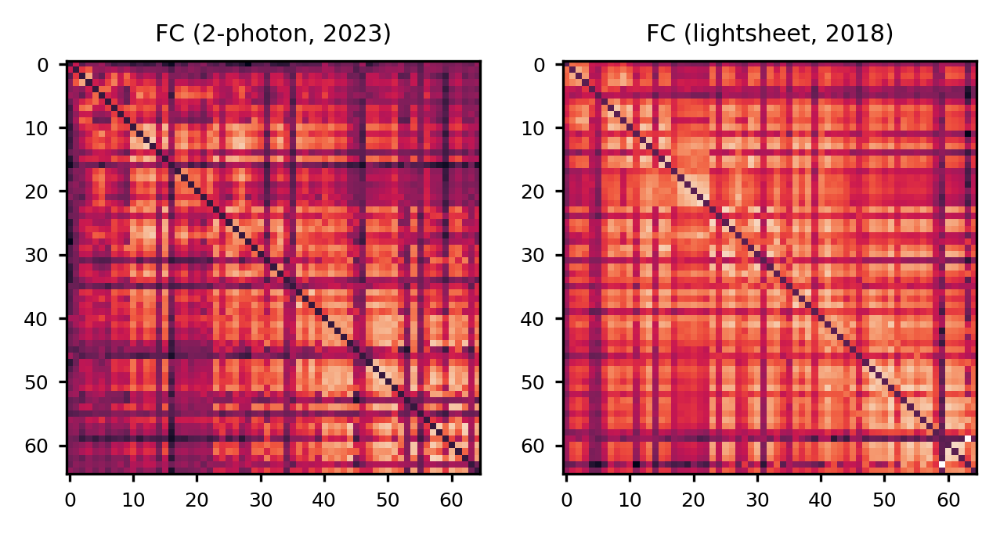

In [137]:
fig, ax = plt.subplots(1, 2, figsize=(5, 2.5), dpi=300)
ax[0].imshow(FC, cmap='rocket', vmax=1)
ax[0].set_title('FC (2-photon, 2023)')
ax[1].imshow(FC_lightsheet, cmap='rocket', vmax=1)
ax[1].set_title('FC (lightsheet, 2018)')

Keeping 53 most rostral regions

In [153]:
cutoff = 53
tri = np.triu_indices(cutoff, 1)
print('Correlation between both functional networks:')
print(pearsonr(FC[tri], FC_lightsheet[tri])[0])

Correlation between both functional networks:
0.6264530402416469


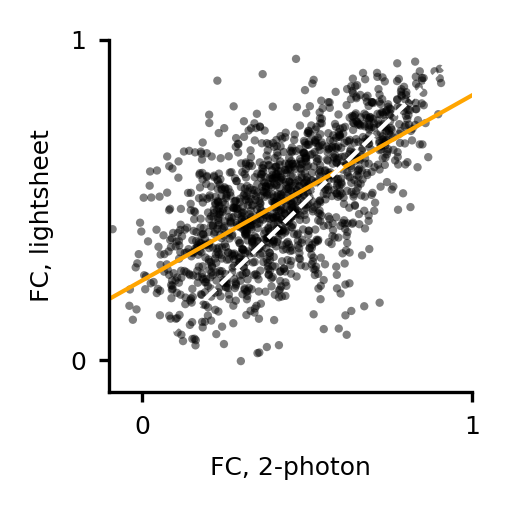

In [154]:
a, b = np.polyfit(FC[tri], FC_lightsheet[tri], 1)
x = np.linspace(-1, 2)
y = a * x + b

fig, ax = plt.subplots(figsize=(1.5, 1.5), dpi=300)
plt.scatter(FC[tri], FC_lightsheet[tri], color='black', edgecolor='none', alpha=0.5, s=4)
ax.plot(x, y, color='orange', linewidth=1)
ax.plot([-1, 1], [-1, 1], linestyle='--', linewidth=1, color='white')
ax.spines[['top', 'right']].set_visible(False)
plt.xlim([-0.1, 1])
plt.ylim([-0.1, 1])
plt.xticks([0, 1])
plt.yticks([0, 1])
plt.xlabel('FC, 2-photon')
plt.ylabel('FC, lightsheet')
plt.tight_layout(pad=0)

#plt.savefig('/home/anleg84/Documents/Figures/scatter2.svg')

# Comparison with 2022 data

In [155]:
FC_2022 = delete_rows_and_columns(np.load('Results/FC_matrix_2022.npy'), excluded)
FC_2023 = FC

Text(0.5, 1.0, 'FC (2-photon, 2022)')

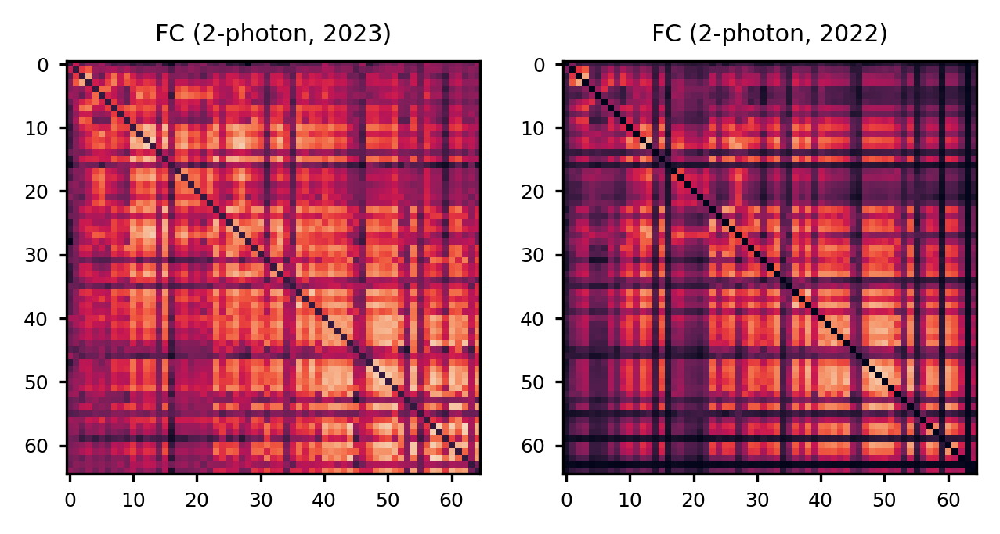

In [156]:
fig, ax = plt.subplots(1, 2, figsize=(5, 2.5), dpi=300)
ax[0].imshow(FC, cmap='rocket', vmax=1)
ax[0].set_title('FC (2-photon, 2023)')
ax[1].imshow(FC_2022, cmap='rocket', vmax=1)
ax[1].set_title('FC (2-photon, 2022)')

Keeping 58 most rostral regions (2022 FOV is smaller)

In [157]:
cutoff = 58
tri = np.triu_indices(cutoff, 1)

In [158]:
print('Correlation between both functional networks:')
print(pearsonr(FC_2022[tri], FC[tri])[0])

Correlation between both functional networks:
0.9005791485588138


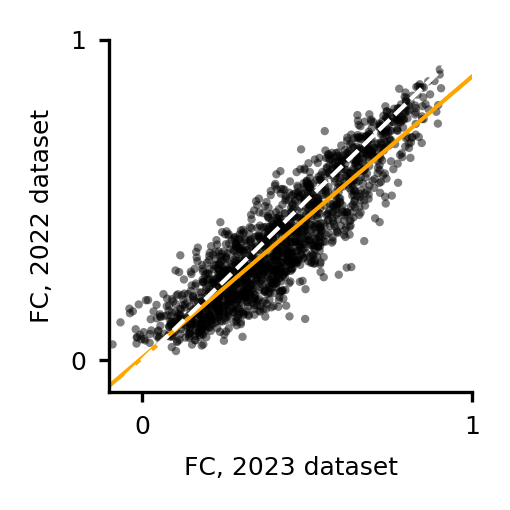

In [159]:
a, b = np.polyfit(FC[tri], FC_2022[tri], 1)
x = np.linspace(-1, 2)
y = a * x + b

fig, ax = plt.subplots(figsize=(1.5, 1.5), dpi=300)
plt.scatter(FC[tri], FC_2022[tri], color='black', edgecolor='none', alpha=0.5, s=4)
ax.plot(x, y, color='orange', linewidth=1)
ax.plot([-1, 1], [-1, 1], linestyle='--', linewidth=1, color='white')
ax.spines[['top', 'right']].set_visible(False)
plt.xlim([-0.1, 1])
plt.ylim([-0.1, 1])
plt.xticks([0, 1])
plt.yticks([0, 1])
plt.xlabel('FC, 2023 dataset')
plt.ylabel('FC, 2022 dataset')
plt.tight_layout(pad=0)

# Making Supplementary figure

Again, here some data is loaded from the private server. This is mostly just for visualization, as the relevant quantitative results here are computed on the FC matrices.

In [99]:
FC_2022 = np.load('Results/FC_matrix_2022.npy')
FC_lightsheet = np.load('Results/FC_matrix_lightsheet.npy')
FC_lightsheet[np.isnan(FC_lightsheet)] = 0

In [100]:
%matplotlib inline

#### Loading dataset (2-photon 2023)

In [101]:
datasets = get_datasets(top_directory, ['920nm', 'wholebrain'])

In [102]:
folder = datasets[11]
timeseries = np.delete(np.load(folder + 'region_series_dff.npy'), excluded, axis=0)
data = load_data(folder)

#### Loading dataset (2-photon 2022)

In [103]:
data_2022 = load_data('/home/anleg84/Documents/Valeria/Data/2022-07-26-Wholebrain-6dpf/data_fish3/')

In [104]:
labels = data_2022['region_labels']
R = labels.shape[1]
timeseries_2022 = np.zeros((R, data_2022['timeseries'].shape[1]))
for i in range(R):
    IDs = (labels[:, i] == True)
    if len(np.where(IDs)[0]) > 0:
        timeseries_2022[i, :] = np.mean(data_2022['timeseries'][IDs, :], axis=0)

In [105]:
timeseries_2022 = timeseries_2022[:, 1350:] # Splitting the experiment in half to match durations

#### Loading dataset (lightsheet)

In [106]:
from scipy.io import loadmat
import mat73

In [107]:
path = '/home/anleg84/Documents/Valeria/Data/Lightsheet-Ahrens/'
files = identify_files(path, ['.mat'])

file = files[0]
try:
    data_lightsheet = loadmat(path + file)
except:
    data_lightsheet = mat73.loadmat(path + file)

In [108]:
data_lightsheet['centroids_atlas'] = np.load(path + 'centroids_mapzebrain_subject10.npy')
data_lightsheet['region_labels'] = np.load(path + 'region_labels_mapzebrain_subject10.npy')

In [109]:
labels = data_lightsheet['region_labels']
R = labels.shape[1]
timeseries_lightsheet = np.zeros((R, data_lightsheet['timeSeries'].shape[1]))
for i in range(R):
    IDs = (labels[:, i] == True)
    if len(np.where(IDs)[0]) > 0:
        timeseries_lightsheet[i, :] = np.mean(data_lightsheet['timeSeries'][IDs, :], axis=0)

In [110]:
indices = np.where(np.array(data_lightsheet['sequence']) == 'Spontaneous')[0]
i1, i2 = data_lightsheet['intervals'][indices[0]]
timeseries_lightsheet = timeseries_lightsheet[:, int(i1):int(i2)]

#### Figure layout

In [111]:
from visualization import *

In [112]:
palette = generate_n_colors(10, saturation=65, value=90)
palette *= 7

cmap = 'Reds'
gray = np.array([194, 194, 194]) / 255
red = np.array([236, 74, 62]) / 255

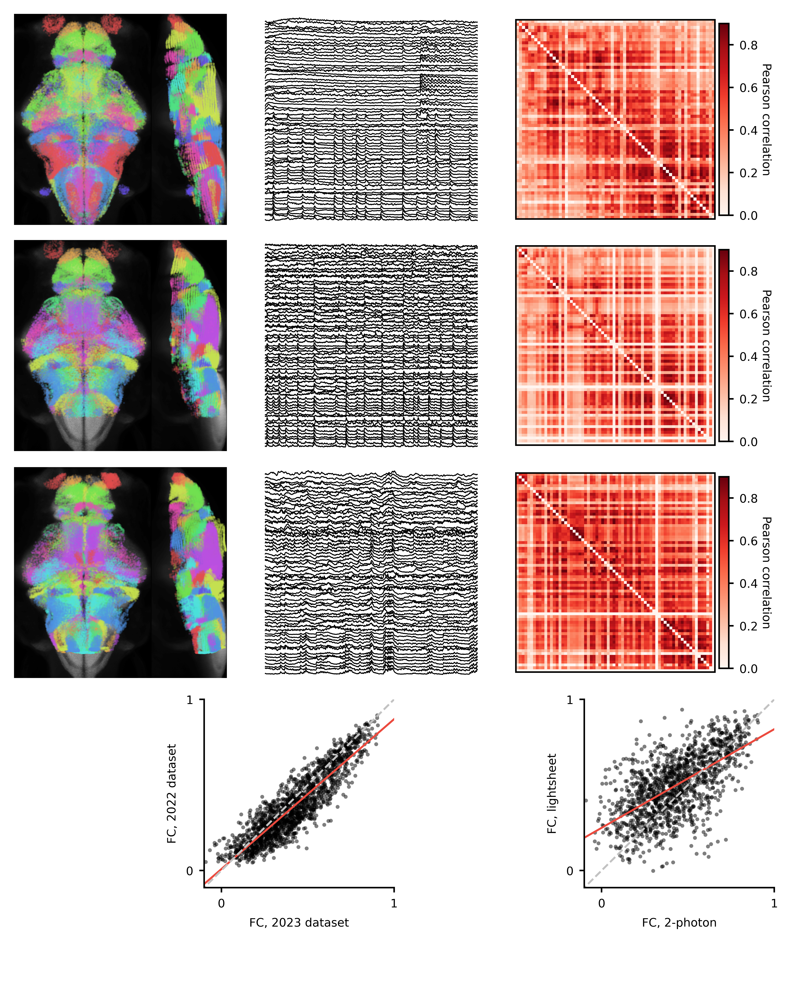

In [115]:
fig = PaperFigure(figsize=(7, 9), dpi=900)

fig.set_tick_length(2.5)
fig.set_font_size(6)
fig.add_background() # Useful when messing with the layout

# Layout ------------------------------------------------------------------------------------

size = 0.28 * 7

fig.add_axes('a1', (0, 0), size, size)
fig.add_axes('a1_1', (0, 0), 0.18 * 7, size)
fig.add_axes('a1_2', (0 + 0.18 * 7, 0), size-(0.18 * 7), size)
fig.add_axes('a2', (0.33 * 7, 0), size, size)
fig.add_axes('a3', (0.66 * 7, 0), size, size)

fig.add_axes('b1', (0, 0.3 * 7), size, size)
fig.add_axes('b1_1', (0, 0.3 * 7), 0.18 * 7, size)
fig.add_axes('b1_2', (0 + 0.18 * 7, 0.3 * 7), size-(0.18 * 7), size)
fig.add_axes('b2', (0.33 * 7, 0.3 * 7), size, size)
fig.add_axes('b3', (0.66 * 7, 0.3 * 7), size, size)

fig.add_axes('c1', (0, 0.6 * 7), size, size)
fig.add_axes('c1_1', (0, 0.6 * 7), 0.18 * 7, size)
fig.add_axes('c1_2', (0 + 0.18 * 7, 0.6 * 7), size-(0.18 * 7), size)
fig.add_axes('c2', (0.33 * 7, 0.6 * 7), size, size)
fig.add_axes('c3', (0.66 * 7, 0.6 * 7), size, size)

fig.add_axes('j', (0.25 * 7, 6.35), 0.25 * 7, 0.25 * 7)
fig.add_axes('k', (0.75 * 7, 6.35), 0.25 * 7, 0.25 * 7)

# Content -----------------------------------------------------------------------------------

# First row

ax = fig.axes['a1']
ax.axis('off')

ax = fig.axes['a1_1']
ax.imshow(atlas.XYprojection, cmap='gray', aspect='auto')
labels = data['region_labels']
centroids = data['centroids_atlas']
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(centroids[labels[:, i], 0], centroids[labels[:, i], 1], s=1, alpha=0.2, edgecolor='None', color=palette[i], rasterized=True)
ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['a1_2']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='gray', aspect='auto')
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(359 - centroids[labels[:, i], 2], centroids[labels[:, i], 1], s=1, alpha=0.15, edgecolor='None', color=palette[i], rasterized=True)
#ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['a2']
z = 0
for i in range(timeseries.shape[0]):
    ax.plot(gaussian_filter1d(normalize(timeseries[i]), 1) - 0.5 * z, color='black', linewidth=0.5)
    z += 1
ax.set_xlim([0, timeseries.shape[1]])
ylim = ax.get_ylim()
ax.set_ylim([ylim[0]+1, ylim[1]-1])
ax.axis('off')

ax = fig.axes['a3']
cax = ax.imshow(FC, cmap=cmap, vmin=0, vmax=0.9)
cbar = plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)
#cbar.set_ticks([0.6, 0.85])
cbar.set_label('Pearson correlation', rotation=270, labelpad=7)
ax.set_xticks([])
ax.set_yticks([])

# Second row

ax = fig.axes['b1']
ax.axis('off')

ax = fig.axes['b1_1']
ax.imshow(atlas.XYprojection, cmap='gray', aspect='auto')
labels = data_2022['region_labels']
centroids = data_2022['centroids_atlas']
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(centroids[labels[:, i], 1], 974 - centroids[labels[:, i], 0], s=1, alpha=0.2, edgecolor='None', color=palette[i], rasterized=True)
ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['b1_2']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='gray', aspect='auto')
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(359 - centroids[labels[:, i], 2], 974 - centroids[labels[:, i], 0], s=1, alpha=0.15, edgecolor='None', color=palette[i], rasterized=True)
#ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['b2']
z = 0
for i in range(timeseries_2022.shape[0]):
    if np.any(timeseries_2022[i]):
        ax.plot(gaussian_filter1d(normalize(timeseries_2022[i]), 1) - 0.5 * z, color='black', linewidth=0.5)
        z += 1
ax.set_xlim([0, timeseries_2022.shape[1]])
ylim = ax.get_ylim()
ax.set_ylim([ylim[0]+1, ylim[1]-1])
#ax.plot([0, 120 * 0.99], [-32.5, -32.5], color='black', linewidth=2)
ax.axis('off')

ax = fig.axes['b3']
cax = ax.imshow(FC_2022, cmap=cmap, vmin=0, vmax=0.9)
cbar = plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)
#cbar.set_ticks([0.6, 0.85])
cbar.set_label('Pearson correlation', rotation=270, labelpad=7)
ax.set_xticks([])
ax.set_yticks([])

# Third row

ax = fig.axes['c1']
ax.axis('off')

ax = fig.axes['c1_1']
ax.imshow(atlas.XYprojection, cmap='gray', aspect='auto')
labels = data_lightsheet['region_labels']
centroids = data_lightsheet['centroids_atlas']
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(centroids[labels[:, i], 1], 974 - centroids[labels[:, i], 0], s=1, alpha=0.2, edgecolor='None', color=palette[i], rasterized=True)
ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['c1_2']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='gray', aspect='auto')
for i in range(labels.shape[1]):
    if i != 10: # Retina
        ax.scatter(359 - centroids[labels[:, i], 2], 974 - centroids[labels[:, i], 0], s=1, alpha=0.15, edgecolor='None', color=palette[i], rasterized=True)
#ax.set_xlim([50, 510])
ax.set_ylim([850, 70])
ax.axis('off')

ax = fig.axes['c2']
z = 0
for i in range(timeseries.shape[0]):
    if np.any(timeseries_lightsheet[i]):
        ax.plot(gaussian_filter1d(normalize(timeseries_lightsheet[i]), 0.1) - 0.5 * z, color='black', linewidth=0.5)
        z += 1
ax.set_xlim([0, timeseries_lightsheet.shape[1]])
ylim = ax.get_ylim()
ax.set_ylim([ylim[0]+1, ylim[1]-1])
#ax.plot([0, 120 * 0.99], [-32.5, -32.5], color='black', linewidth=2)
ax.axis('off')

ax = fig.axes['c3']
cax = ax.imshow(FC_lightsheet, cmap=cmap, vmin=0, vmax=0.9)
cbar = plt.colorbar(cax, ax=ax, fraction=0.045, pad=0.02)
#cbar.set_ticks([0.6, 0.85])
cbar.set_label('Pearson correlation', rotation=270, labelpad=7)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['j']
cutoff = 58
tri = np.triu_indices(58, 1)
M = delete_rows_and_columns(FC_2022, excluded)
a, b = np.polyfit(FC[tri], M[tri], 1)
x = np.linspace(-1, 2)
y = a * x + b
ax.scatter(FC[tri], M[tri], color='black', edgecolor='none', alpha=0.5, s=4)
ax.plot(x, y, color=red, linewidth=1)
ax.plot([-1, 1], [-1, 1], linestyle='--', linewidth=1, color=gray)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.1, 1])
ax.set_ylim([-0.1, 1])
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xlabel('FC, 2023 dataset')
ax.set_ylabel('FC, 2022 dataset')

ax = fig.axes['k']
cutoff = 53
tri = np.triu_indices(cutoff, 1)
M = delete_rows_and_columns(FC_lightsheet, excluded)
a, b = np.polyfit(FC[tri], M[tri], 1)
x = np.linspace(-1, 2)
y = a * x + b
ax.scatter(FC[tri], M[tri], color='black', edgecolor='none', alpha=0.5, s=4)
ax.plot(x, y, color=red, linewidth=1)
ax.plot([-1, 1], [-1, 1], linestyle='--', linewidth=1, color=gray)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.1, 1])
ax.set_ylim([-0.1, 1])
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xlabel('FC, 2-photon')
ax.set_ylabel('FC, lightsheet')

# Displaying --------------------------------------------------------------------------------

fig.show()

In [33]:
fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/supp_datasets_incomplete.png')